주어진 데이터는 소프트웨어의 특성 및 품질을 측정하는 데 사용되는 항목들에 대한 데이터이다. 소프트웨어 개발 프로세스나 코드의 복잡성, 유지보수성, 품질 등을 평가할 수 있는 항목들인데 이 값에 따른 defect 판결 여부가 주어져 있다. 주어진 데이터를 학습하여 이후 새로운 소프트웨어 정보가 들어왔을 때 defect 여부를 판별하는 데 활용하고자 인공지능을 이용하려 한다. 

# NN

In [54]:
from __future__ import print_function
import os
data_path = ['data']

from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

In [55]:
import pandas as pd

# Import the data using the file path
filepath = os.sep.join(data_path + ['train.csv'])
data = pd.read_csv(filepath)

In [56]:
data.head(1).T

,0
id,0
loc,22.0
v(g),3.0
ev(g),1.0
iv(g),2.0
n,60.0
v,278.63
l,0.06
d,19.56
i,14.25


In [57]:
lb = LabelBinarizer()

for col in ['defects']:
    data[col] = lb.fit_transform(data[col]) # transforming each string to number e.g. no -> 0, yes -> 1

In [58]:
# Mute the sklearn warning
import warnings
warnings.filterwarnings('ignore', module='sklearn')

msc = MinMaxScaler() # rescale the distribution to 0 and 1
ssc = StandardScaler()

SSC = 0; MSC = 1

target_column = 'defects'
target_data = data[target_column]

feature_columns = [col for col in data.columns if col != target_column]
feature_data = data[feature_columns]

target_data = pd.DataFrame(msc.fit_transform(target_data.values.reshape(-1, 1)),  # this is an np.array, not a dataframe.
                        columns=[target_column]) # np.array -> dataframe
if(SSC): 
    feature_data = pd.DataFrame(ssc.fit_transform(feature_data), columns=feature_columns)
else:
    feature_data = pd.DataFrame(msc.fit_transform(feature_data), columns=feature_columns)
    
data_scaled = pd.concat([feature_data, target_data], axis=1)

In [59]:
print(data.head())

# Get a list of all the columns that don't contain the label
x_cols = [x for x in data.columns if x != 'defects']

# Split the data into two dataframes
X_data = data[x_cols]
y_data = data['defects']

print(y_data)

   id   loc  v(g)  ev(g)  iv(g)     n       v     l      d      i  ...  \
0   0  22.0   3.0    1.0    2.0  60.0  278.63  0.06  19.56  14.25  ...   
1   1  14.0   2.0    1.0    2.0  32.0  151.27  0.14   7.00  21.11  ...   
2   2  11.0   2.0    1.0    2.0  45.0  197.65  0.11   8.05  22.76  ...   
3   3   8.0   1.0    1.0    1.0  23.0   94.01  0.19   5.25  17.86  ...   
4   4  11.0   2.0    1.0    2.0  17.0   60.94  0.18   5.63  12.44  ...   

   lOCode  lOComment  lOBlank  locCodeAndComment  uniq_Op  uniq_Opnd  \
0      17          1        1                  0     16.0        9.0   
1      11          0        1                  0     11.0       11.0   
2       8          0        1                  0     12.0       11.0   
3       4          0        2                  0      8.0        6.0   
4       7          0        2                  0      7.0        6.0   

   total_Op  total_Opnd  branchCount  defects  
0      38.0        22.0          5.0        0  
1      18.0        14.0   

In [60]:
knn = KNeighborsClassifier(n_neighbors=3) # 3-NN

knn = knn.fit(X_data, y_data)

y_pred = knn.predict(X_data)
print(y_pred)

[0 0 0 ... 0 0 1]


In [61]:
# Function to calculate the % of values that were correctly predicted

def accuracy(real, predict):
    return sum(real == predict) / float(real.shape[0])

In [62]:
print(accuracy(y_data, y_pred))

0.8628283364287609


높은 성능을 보이는 것을 확인할 수 있었다. 

In [63]:
knn = KNeighborsClassifier(n_neighbors=3, weights='distance') # 3-NN + added weight depending on the Euclidean Distance

knn = knn.fit(X_data, y_data)

y_pred = knn.predict(X_data)

print(accuracy(y_data, y_pred))

1.0


distance에 따라 가중치를 더하게 만드니 더 높은 성능을 보이는 것을 확인할 수 있었다. 

In [64]:
# Fit the K-nearest neighbors model with different values of k
# Store the accuracy measurement for each k

score_list = list()

for k in range(1, 21):
    
    knn = KNeighborsClassifier(n_neighbors=k)
    knn = knn.fit(X_data, y_data)
    
    y_pred = knn.predict(X_data)
    score = accuracy(y_data, y_pred)
    
    score_list.append((k, score))
    
score_df = pd.DataFrame(score_list, columns=['k', 'accuracy'])

In [65]:
# Import libraries to make the plot

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

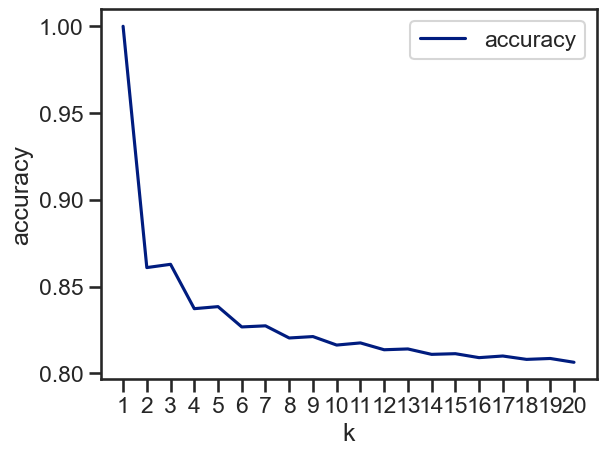

In [66]:
sns.set_context('talk')
sns.set_style('ticks')
sns.set_palette('dark')

ax = score_df.set_index('k').plot()

ax.set(xlabel='k', ylabel='accuracy')
ax.set_xticks(range(1, 21))

K가 1일 때 가장 높은 성능을 보이는 걸 확인할 수 있다. 위에서 진행했던 K가 3일 때도 두 번째로 높은 성능을 보여 비교적 적합한 알고리즘이라고 볼 수 있을 것 같다. 

# Naive Bayes

data path 설정

In [1]:
from __future__ import print_function
import os
#Data Path has to be set as per the file location in your system
#data_path = ['..', 'data']
data_path = ['data']

데이터 읽어오기

In [2]:
import pandas as pd
import numpy as np
#The filepath is dependent on the data_path set in the previous cell 
filepath = os.sep.join(data_path + ['train.csv'])
data = pd.read_csv(filepath, sep=',', header=0)

데이터 타입 확인

In [3]:
data.dtypes

id                     int64
loc                  float64
v(g)                 float64
ev(g)                float64
iv(g)                float64
n                    float64
v                    float64
l                    float64
d                    float64
i                    float64
e                    float64
b                    float64
t                    float64
lOCode                 int64
lOComment              int64
lOBlank                int64
locCodeAndComment      int64
uniq_Op              float64
uniq_Opnd            float64
total_Op             float64
total_Opnd           float64
branchCount          float64
defects                 bool
dtype: object

데이터 값이 치우쳐져 있는지 확인. 
True 값이면 치우쳐져 있는 것인데 치우쳐져 있는 데이터가 많은 것을 확인할 수 있었다. 

In [4]:
skew = pd.DataFrame(data.skew())
skew.columns = ['skew']
skew['too_skewed'] = skew['skew'] > .75
skew

,skew,too_skewed
id,0.000000,False
loc,11.818912,True
v(g),14.258631,True
ev(g),6.513498,True
iv(g),28.209964,True
n,9.908514,True
v,15.959869,True
l,1.903337,True
d,5.618081,True
i,4.859743,True


특징들 간의 연관성 확인. l, t를 사용하면 가장 classify할 수 있을 것으로 예상했다

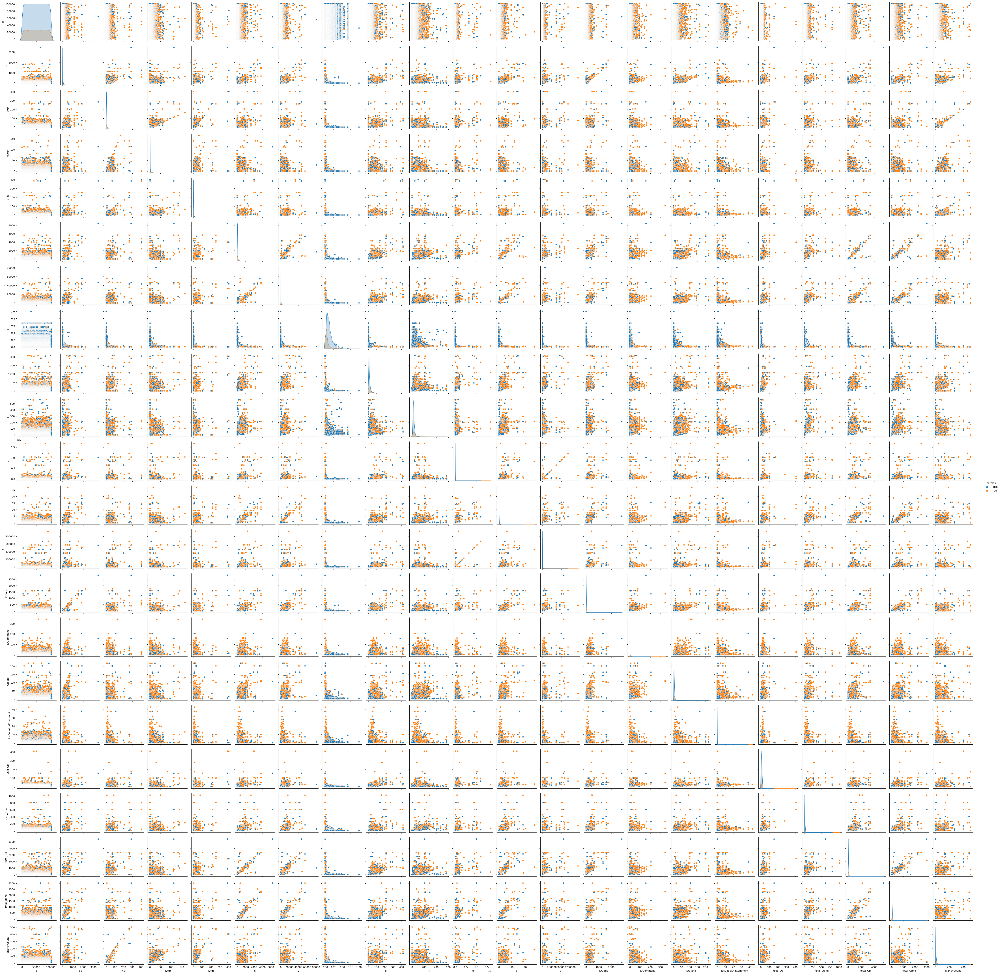

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.pairplot(data, hue='defects')

In [13]:
y = (data['defects'] == True ).astype(int)
fields = list(data.columns[:-1])  # everything except "defects"
correlations = data[fields].corrwith(y) # 특징들과 클래스 사이에서의 correlation
correlations.sort_values(inplace=True)
correlations

l                   -0.253237
id                   0.001976
e                    0.095366
t                    0.099592
locCodeAndComment    0.133150
uniq_Op              0.178474
lOComment            0.205402
i                    0.208577
v                    0.231179
b                    0.232594
d                    0.241936
iv(g)                0.245618
uniq_Opnd            0.246113
total_Op             0.250533
lOCode               0.250604
total_Opnd           0.252752
lOBlank              0.257819
n                    0.258080
ev(g)                0.259928
v(g)                 0.301187
branchCount          0.322827
loc                  0.342642
dtype: float64

[(-1.0, 1.0), Text(0, 0.5, 'pearson correlation')]

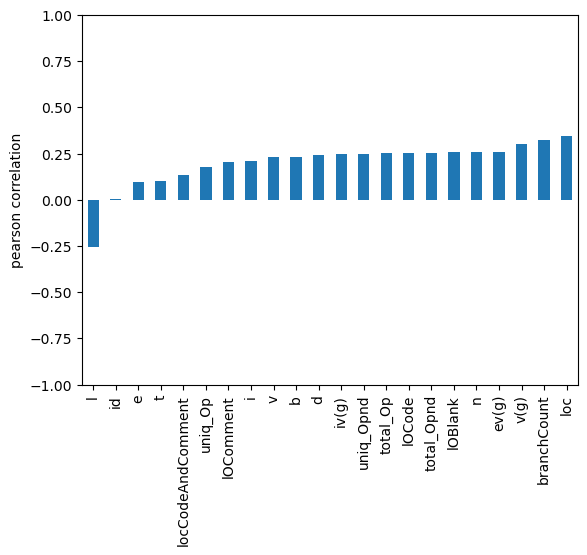

In [14]:
ax = correlations.plot(kind='bar')
ax.set(ylim=[-1, 1], ylabel='pearson correlation')

In [15]:
fields = correlations.map(abs).sort_values().iloc[-2:].index # 절댓값 취해주고 sorting해서 두 개 특징만 뽑기
print(fields)

Index(['branchCount', 'loc'], dtype='object')


In [9]:
# Since the features are continuous, the right choice is GaussianNB

from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
X = data[data.columns[:-1]] # 클래스 제외 모든 특징 불러 옴
y = data.defects

GNB = GaussianNB()
cv_N = 4
scores = cross_val_score(GNB, X, y, n_jobs=cv_N, cv=cv_N) # 모델 성능 확인
print(scores)
np.mean(scores)

[0.79737432 0.80044023 0.79992925 0.79846698]


0.7990526951277577

GaussianNB로의 채택과 성능 실험
-> 네 번의 반복 실험을 한 결과와 그 평균

In [11]:
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
X = data[data.columns[:-1]]
y = data.defects
nb = {'gaussian': GaussianNB(),
      'bernoulli': BernoulliNB(),
      'multinomial': MultinomialNB()}
scores = {}
for key, model in nb.items():
    s = cross_val_score(model, X, y, cv=cv_N, n_jobs=cv_N, scoring='accuracy')
    scores[key] = np.mean(s)
scores

{'gaussian': 0.7990526951277577,
 'bernoulli': 0.7688747158921654,
 'multinomial': 0.7470499272549213}

다른 NB 모델 사용 시의 성능도 체크해보았는데 비슷하다. 

In [18]:
X = data[['l', 'loc']]
y = data.defects

nb = {'gaussian': GaussianNB(),
      'bernoulli': BernoulliNB(),
      'multinomial': MultinomialNB()}

scores = {}
for key, model in nb.items():
    s = cross_val_score(model, X, y, cv=cv_N, n_jobs=cv_N, scoring='accuracy')
    scores[key] = np.mean(s)
scores

{'gaussian': 0.8060296881871707,
 'bernoulli': 0.7733557382675269,
 'multinomial': 0.7752326468949369}

-> correlation 그래프를 참고해 predictive feature로 보이는 특징들로 진행하니 성능이 향상된 것을 볼 수 있었다. 하지만 NN보다 낮은 성능을 보이는 것 같다. 

In [19]:
X = data[['branchCount', 'loc']]
y = data.defects

nb = {'gaussian': GaussianNB(),
      'bernoulli': BernoulliNB(),
      'multinomial': MultinomialNB()}

scores = {}
for key, model in nb.items():
    s = cross_val_score(model, X, y, cv=cv_N, n_jobs=cv_N, scoring='accuracy')
    scores[key] = np.mean(s)
scores

{'gaussian': 0.8044377553385945,
 'bernoulli': 0.7733557382675269,
 'multinomial': 0.7756748468802772}

-> correlation 절댓값 가장 큰 두 특징으로 실행한 결과. 앞선 결과와 성능은 비슷하게 향상된 걸 알 수 있다. 

In [ ]:
X = data[data.columns[:-1]]
y = data.defects

n_copies = [0, 1, 3, 5, 10, 50, 100, 1000]


def create_copies_branchCount(X, n):
    # X_new = pd.DataFrame()
    # X_new['branchCount'] = X['branchCount']
    # X_new = pd.concat([X, X_new], axis=1)
    X_new = X.copy()
    for i in range(n):
        X_new['branchCount_copy%s' % i] = X['branchCount']
    return X_new


def get_cross_val_score(n): # 성능 체크
    X_new = create_copies_branchCount(X, n)
    scores = cross_val_score(GaussianNB(), X_new, y, cv=cv_N, n_jobs=cv_N)
    return np.mean(scores)

avg_scores = pd.Series(
    [get_cross_val_score(n) for n in n_copies],
    index=n_copies)

ax = avg_scores.plot()
ax.set(
    xlabel='number of extra copies of "branchCount"',
    ylabel='average accuracy score',
    title='Decline in Naive Bayes performance')

[Text(0.5, 0, 'number of extra copies of "branchCount"'),
 Text(0, 0.5, 'average accuracy score'),
 Text(0.5, 1.0, 'Decline in Naive Bayes performance')]

<img src = "output.png">

branchCount 열의 복사본을 생성해서 사용할 때 어떤 결과가 나오는지 알아보는 코드를 돌려본 결과 초반엔 성능이 크게 증가하지만 갈수록 줄어드는 것을 확인할 수 있었다. 근데 exercise 노트에서의 결과와는 다르게 완만하게 수렴하는 그래프가 그려지지는 않아, 특징들간의 독립성이 적고 의존성이 강해 그런 결과가 나온 것이 아닌가 추측해보았다.

# Support Vector Machines and Kernels

Support Vector: 두 클래스를 나누는 경계에 있는 데이터
Support Vectors를 갖고 클래스를 분리하는 방식이 Support Vector Machines

Kernel: 데이터를 작위적으로 변화시키는 것. linear 하게 분류가 가능하도록.

In [27]:
from __future__ import print_function
import os
data_path = [ 'data']

from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.kernel_approximation import Nystroem
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import MinMaxScaler

In [32]:
import pandas as pd
import numpy as np

filepath = os.sep.join(data_path + ['train.csv'])
data = pd.read_csv(filepath, sep=',')

In [33]:
y = (data['defects'] == True).astype(int) # red 면 True, white면 false
fields = list(data.columns[:-1])  # everything except "color"
correlations = data[fields].corrwith(y) # 특징들과 클래스 사이에서의 correlation
correlations.sort_values(inplace=True)
correlations

l                   -0.253237
id                   0.001976
e                    0.095366
t                    0.099592
locCodeAndComment    0.133150
uniq_Op              0.178474
lOComment            0.205402
i                    0.208577
v                    0.231179
b                    0.232594
d                    0.241936
iv(g)                0.245618
uniq_Opnd            0.246113
total_Op             0.250533
lOCode               0.250604
total_Opnd           0.252752
lOBlank              0.257819
n                    0.258080
ev(g)                0.259928
v(g)                 0.301187
branchCount          0.322827
loc                  0.342642
dtype: float64

In [34]:
fields = correlations.map(abs).sort_values().iloc[-2:].index # 절댓값 취해주고 sorting해서 두 개 특징만 뽑기
print(fields)
X = data[fields]
scaler = MinMaxScaler() # 데이터 스케일링 작업
X = scaler.fit_transform(X)
X = pd.DataFrame(X, columns=['%s_scaled' % fld for fld in fields])
print(X.columns)

Index(['branchCount', 'loc'], dtype='object')
Index(['branchCount_scaled', 'loc_scaled'], dtype='object')


/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(


[Text(0.5, 0, 'branchCount'),
 Text(0, 0.5, 'loc'),
 (0.0, 1.0),
 (0.0, 1.0),
 Text(0.5, 1.0, 'decision boundary for LinearSVC')]

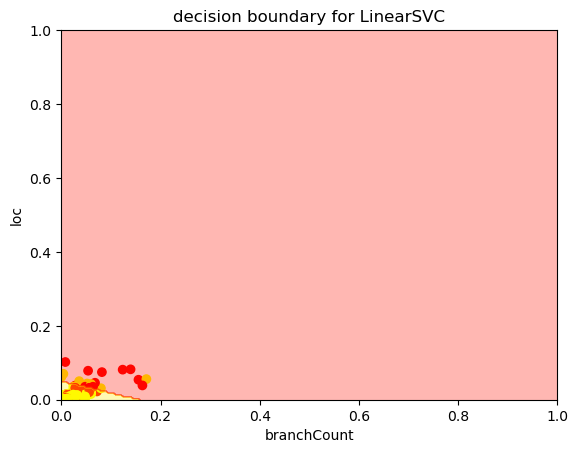

In [37]:
LSVC = LinearSVC()
LSVC.fit(X, y)

X_color = X.sample(300, random_state=45) # 300개 랜덤 샘플링해서 분류해보고 plotting
y_color = y.loc[X_color.index]
y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')
ax = plt.axes()
ax.scatter(
    X_color.iloc[:, 0], X_color.iloc[:, 1],
    color=y_color, alpha=1)
# -----------
x_axis, y_axis = np.arange(0, 1.005, .005), np.arange(0, 1.005, .005)
xx, yy = np.meshgrid(x_axis, y_axis)
xx_ravel = xx.ravel()
yy_ravel = yy.ravel()
X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
y_grid_predictions = LSVC.predict(X_grid)
y_grid_predictions = y_grid_predictions.reshape(xx.shape)
ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3)
# -----------
ax.set(
    xlabel=fields[0],
    ylabel=fields[1],
    xlim=[0, 1],
    ylim=[0, 1],
    title='decision boundary for LinearSVC')

In [38]:
def plot_decision_boundary(estimator, X, y):
    estimator.fit(X, y)
    X_color = X.sample(300)
    y_color = y.loc[X_color.index]
    y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')
    x_axis, y_axis = np.arange(0, 1, .005), np.arange(0, 1, .005)
    xx, yy = np.meshgrid(x_axis, y_axis)
    xx_ravel = xx.ravel()
    yy_ravel = yy.ravel()
    X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
    y_grid_predictions = estimator.predict(X_grid)
    y_grid_predictions = y_grid_predictions.reshape(xx.shape)

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3)
    ax.scatter(X_color.iloc[:, 0], X_color.iloc[:, 1], color=y_color, alpha=1)
    ax.set(
        xlabel=fields[0],
        ylabel=fields[1],
        title=str(estimator))

/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


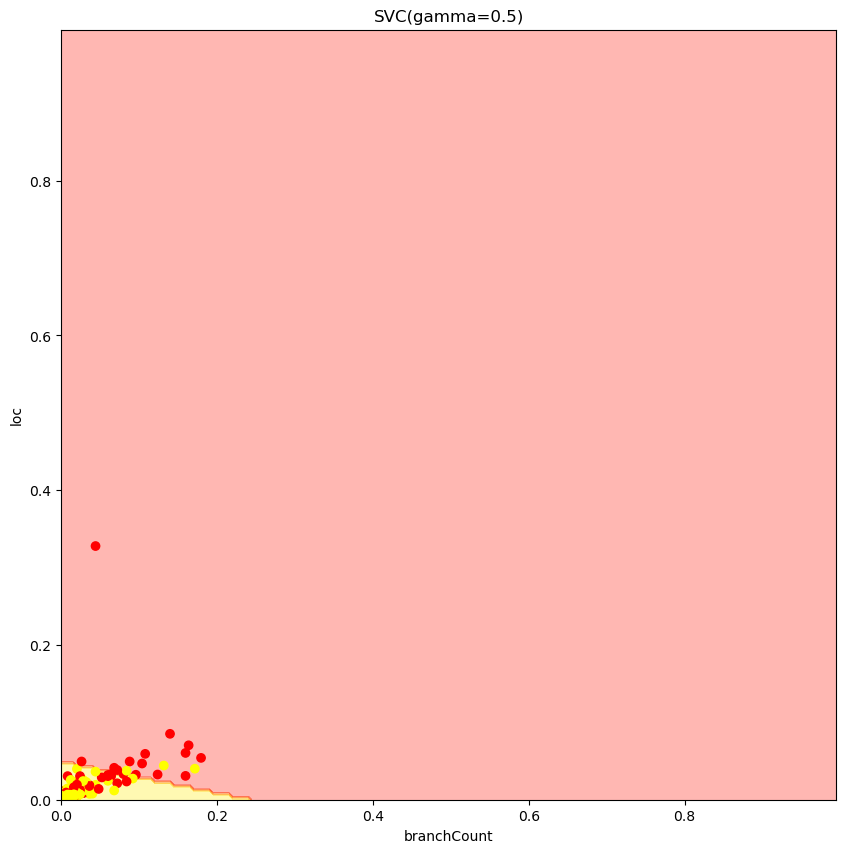

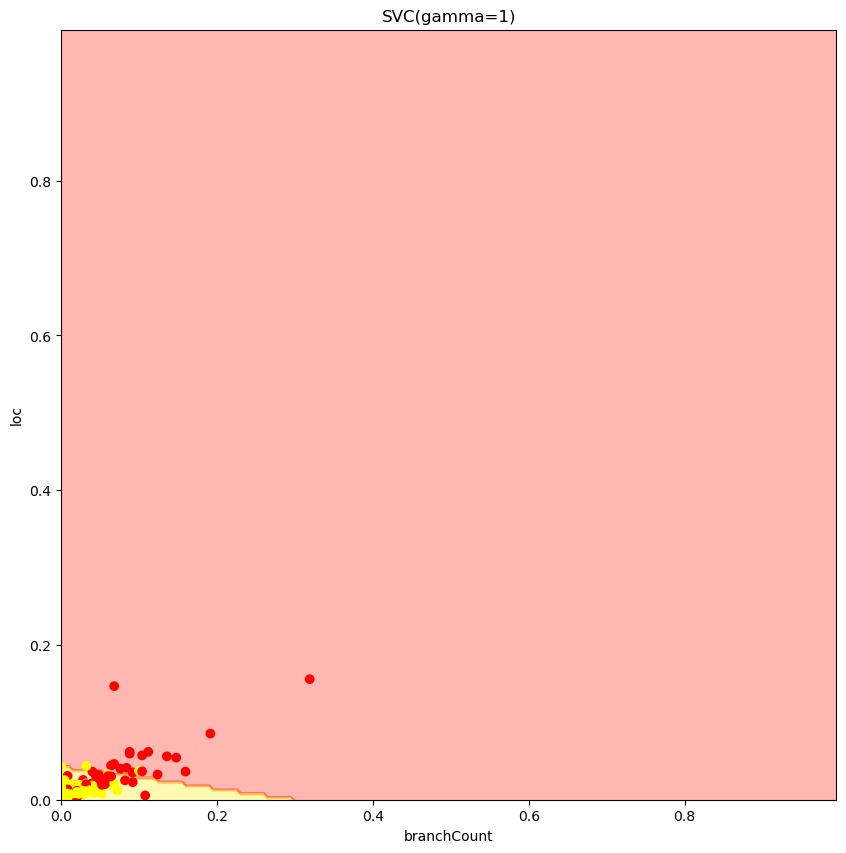

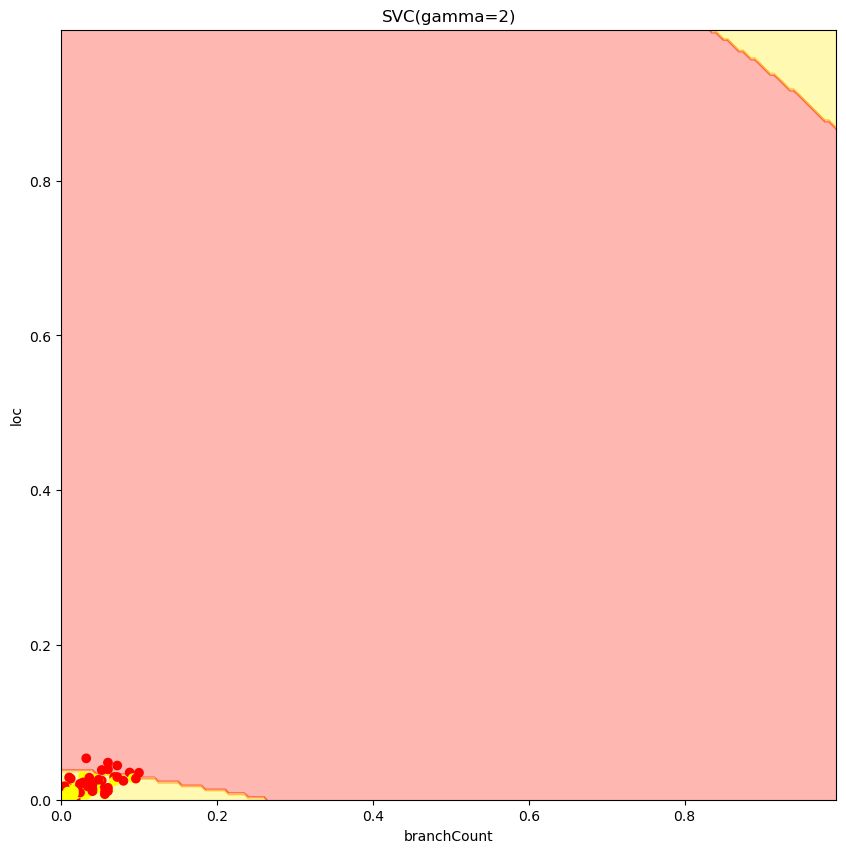

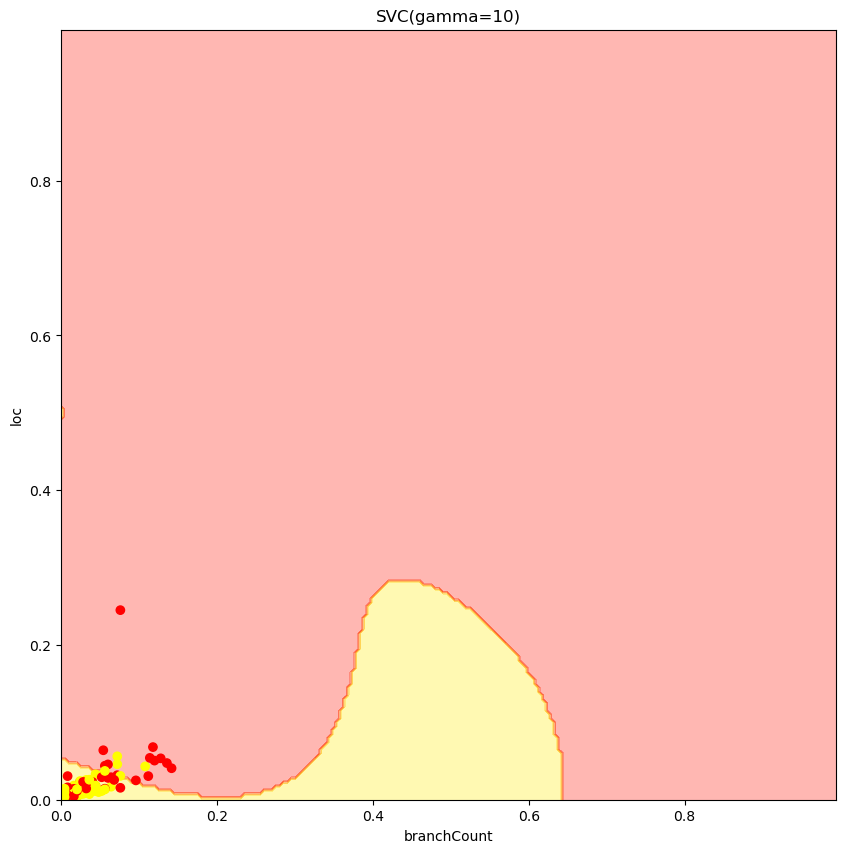

In [39]:
gammas = [.5, 1, 2, 10] # Gaussian에서의 파라미터. 감마값이 커짐에 따라 판단 기준 선의 곡률이 더 커진다. 
# 곡률 조정함으로써 정확도 개선이 가능하다
for gamma in gammas:
    SVC_Gaussian = SVC(kernel='rbf', gamma=gamma) # rbf 커널
    plot_decision_boundary(SVC_Gaussian, X, y)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


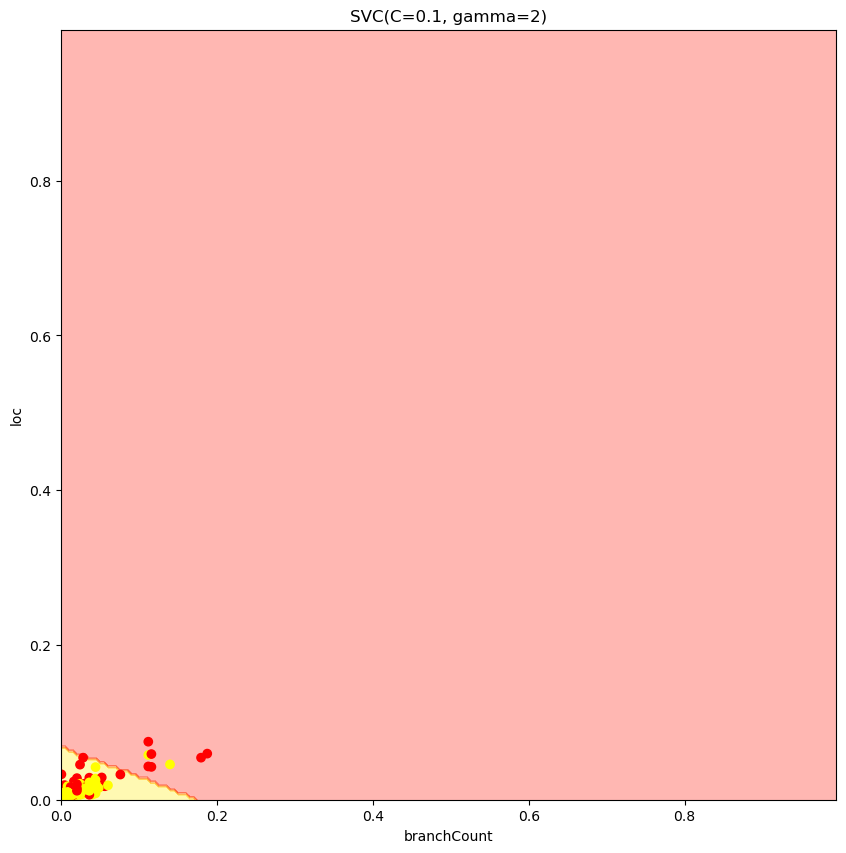

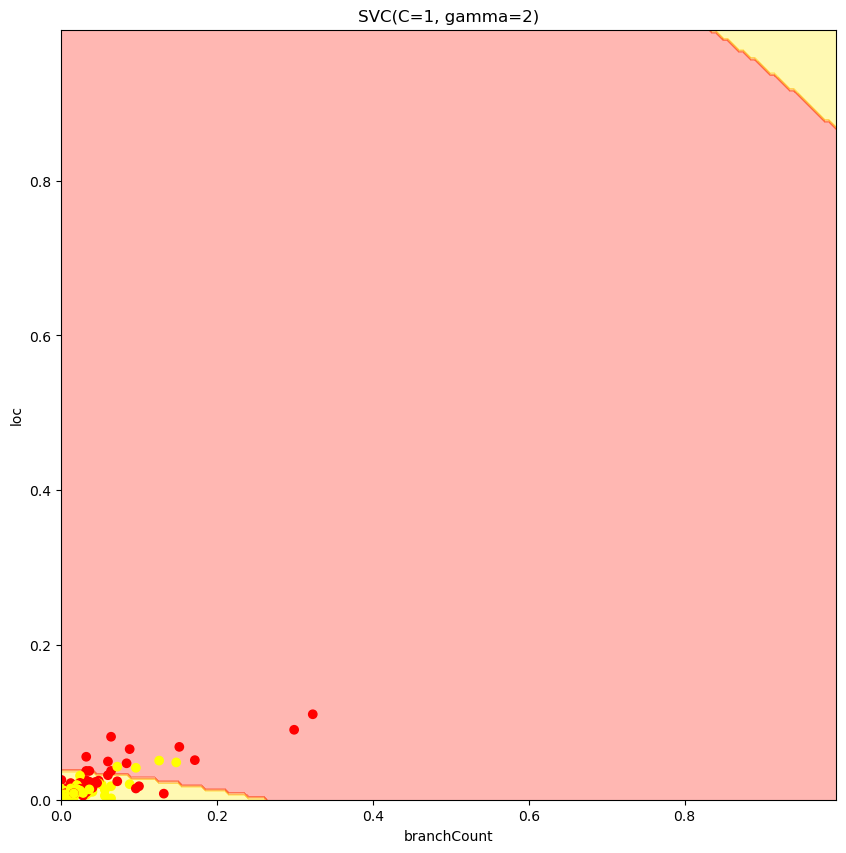

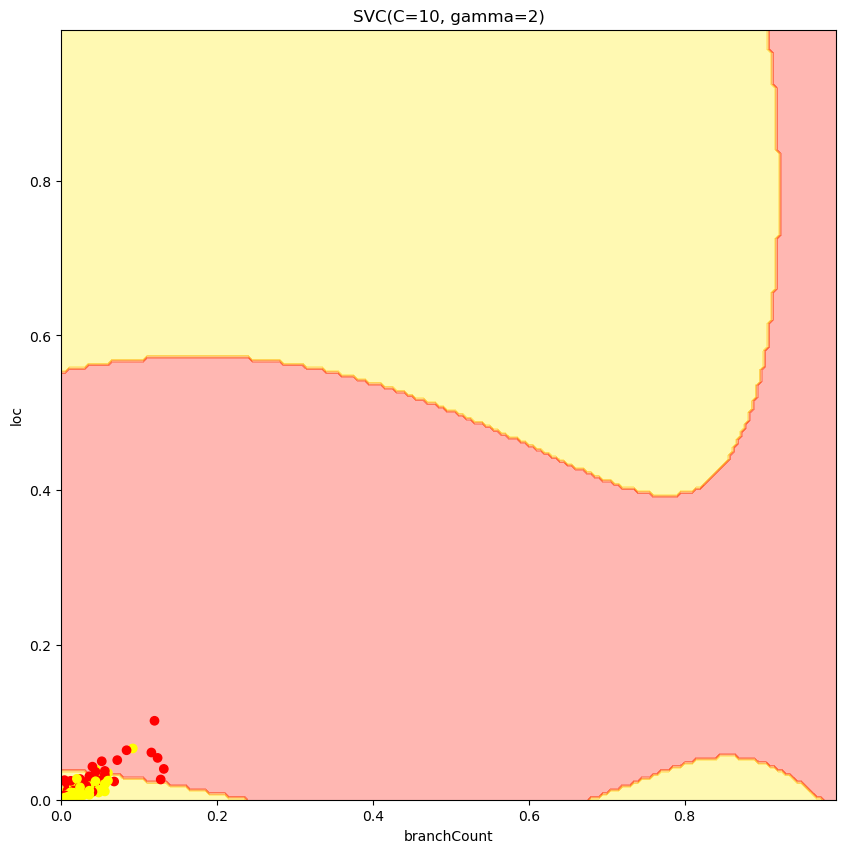

In [40]:
Cs = [.1, 1, 10] # C: 마진 결정. 낮으면 크게.(오버피팅 피할 수 있지만 training data에 대한 정확도 떨어짐) 크면 클수록 마진 작게. 
for C in Cs:
    SVC_Gaussian = SVC(kernel='rbf', gamma=2, C=C)
    plot_decision_boundary(SVC_Gaussian, X, y)

In [70]:
y = data.defects == True
X = data[data.columns[:-1]]

kwargs = {'kernel': 'rbf'}
svc = SVC(**kwargs)
nystroem = Nystroem(**kwargs)  # Nystroem을 사용하면 더 빨리 계산이 가능하다. 계산을 빠르게 만드는 알고리즘
sgd = SGDClassifier()

In [ ]:
%%timeit
svc.fit(X, y) # 시간이 매우 오래 걸린다.
# fit 하면 non linear mapping이 스스로 이루어진다. 
# 분류가 최적으로 잘되는 스페이스를 찾고 그 안에서 학습을 한다. 

-> 돌려보았지만 너무 오래 걸려 nystroem으로 하였습니다... 

In [72]:
%%timeit
X_transformed = nystroem.fit_transform(X) # 시간이 더 적게 걸린다. 
sgd.fit(X_transformed, y) 

454 ms ± 8.01 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [73]:
X2 = pd.concat([X]*5) # 데이터 개수를 5배로 늘림
y2 = pd.concat([y]*5)

print(X2.shape)
print(y2.shape)

(508815, 22)
(508815,)


In [74]:
%timeit 
svc.fit(X2, y2) # 더 오래 걸릴 수밖에 없다. 모든 샘플에 대한 최적의 마진을 결정해야 하니까. 

-> 돌려보았지만 너무 오래 걸려 중단하였습니다... 

In [ ]:
%%timeit 
X2_transformed = nystroem.fit_transform(X2) # 훨씬 빠르다. 복사된 샘플에 대해선 어느정도 계산을 생략해주기 때문이다. 
sgd.fit(X2_transformed, y2)

# Decision Tree

노드를 거치며 if then을 거쳐 특징들을 살펴보며 leaf node까지 도달
조건을 따라 내려오면서 클래스 분류. 

기존 알고리즘: 모든 특징들은 한 수식에서 동시에 계산
DT: 중요한 특징부터 상단에 위치시켜 순차적으로 계산. 중요한 특징: 분류를 잘 시키는 특징. 

각 노드에 어떤 특징을 둘 것인가, 기준 값은 어떻게 할 것인가. 이걸 학습하는 것. 
분기 전과 분기 후의 엔트로피를 계산해서 변화 확인하며 수정, 개선

greedy search를 이용하는 게 가장 대표적이다. best split 찾아 노드에 feature 두기

장점: 쉽다. 해석이 쉽다. if-then 문장에 의해 진행되고 tree를 그릴 수 있기에 시각적인 inspection이 가능하다. binary든 continuous든 어떤 데이터든 다룰 수 있다. 전처리나 scaling이 필요없다. raw data 그대로 사용할 수 있다. 

단점: overfitting에 취약하다. 100% pure한 노드에 도달하게 만든다면 오버피팅되는 것. pruning을 통해 overfitting을 방지할 수 있긴 하다.

In [41]:
from __future__ import print_function
import os
data_path = ['data']

from io import StringIO
from IPython.display import Image, display

from sklearn.tree import export_graphviz
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier


In [42]:
import pandas as pd
import numpy as np

filepath = os.sep.join(data_path + ['train.csv'])
data = pd.read_csv(filepath, sep=',')

In [43]:
data.head()

,id,loc,v(g),ev(g),iv(g),n,v,l,d,i,...,lOCode,lOComment,lOBlank,locCodeAndComment,uniq_Op,uniq_Opnd,total_Op,total_Opnd,branchCount,defects
0,0,22.0,3.0,1.0,2.0,60.0,278.63,0.06,19.56,14.25,...,17,1,1,0,16.0,9.0,38.0,22.0,5.0,False
1,1,14.0,2.0,1.0,2.0,32.0,151.27,0.14,7.00,21.11,...,11,0,1,0,11.0,11.0,18.0,14.0,3.0,False
2,2,11.0,2.0,1.0,2.0,45.0,197.65,0.11,8.05,22.76,...,8,0,1,0,12.0,11.0,28.0,17.0,3.0,False
3,3,8.0,1.0,1.0,1.0,23.0,94.01,0.19,5.25,17.86,...,4,0,2,0,8.0,6.0,16.0,7.0,1.0,True
4,4,11.0,2.0,1.0,2.0,17.0,60.94,0.18,5.63,12.44,...,7,0,2,0,7.0,6.0,10.0,10.0,3.0,False


In [44]:
data.dtypes

id                     int64
loc                  float64
v(g)                 float64
ev(g)                float64
iv(g)                float64
n                    float64
v                    float64
l                    float64
d                    float64
i                    float64
e                    float64
b                    float64
t                    float64
lOCode                 int64
lOComment              int64
lOBlank                int64
locCodeAndComment      int64
uniq_Op              float64
uniq_Opnd            float64
total_Op             float64
total_Opnd           float64
branchCount          float64
defects                 bool
dtype: object

decision tree의 장점: 모든 데이터 타입을 동일하게 맞춰줄 필요가 없다
linear regression은 데이터 타입 맞추려고 onehot encoding하고 scaling 필요로 했었다.

In [45]:
data['defects'] = data.defects.replace(False,0).replace(True,1).astype(int) 
# False면 0, True면 1로 바꿔준다. 

In [46]:
# All data columns except for defects
feature_cols = [x for x in data.columns if x not in 'defects']

In [47]:
# Split the data into two parts with 1000 points in the test data
# This creates a generator
strat_shuff_split = StratifiedShuffleSplit(n_splits=1, test_size=1000, random_state=42)

# Get the index values from the generator
train_idx, test_idx = next(strat_shuff_split.split(data[feature_cols], data['defects']))

# Create the data sets
X_train = data.loc[train_idx, feature_cols]
y_train = data.loc[train_idx, 'defects']

X_test = data.loc[test_idx, feature_cols]
y_test = data.loc[test_idx, 'defects']

In [48]:
y_train.value_counts(normalize=True).sort_index()

0    0.773359
1    0.226641
Name: defects, dtype: float64

In [49]:
y_test.value_counts(normalize=True).sort_index()

0    0.773
1    0.227
Name: defects, dtype: float64

In [50]:
dt = DecisionTreeClassifier(random_state=42)
dt = dt.fit(X_train, y_train)

In [51]:
dt.tree_.node_count, dt.tree_.max_depth

(33469, 53)

In [52]:
def measure_error(y_true, y_pred, label):
    return pd.Series({'accuracy':accuracy_score(y_true, y_pred),
                      'precision': precision_score(y_true, y_pred),
                      'recall': recall_score(y_true, y_pred),
                      'f1': f1_score(y_true, y_pred)},
                      name=label)

In [53]:
# The error on the training and test data sets
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

train_test_full_error = pd.concat([measure_error(y_train, y_train_pred, 'train'),
                              measure_error(y_test, y_test_pred, 'test')],
                              axis=1)

train_test_full_error

,train,test
accuracy,1.0,0.717000
precision,1.0,0.382353
recall,1.0,0.400881
f1,1.0,0.391398


training에 대해서는 완벽한 성능을, 하지만 DT의 단점인 오버피팅에 취약하다는 점 때문에 test 결과에서는 낮은 성능을 보이는 것을 확인할 수 있었다. 

In [ ]:
param_grid = {'max_depth':range(1, dt.tree_.max_depth+1, 2),
              'max_features': range(1, len(dt.feature_importances_)+1)}

GR = GridSearchCV(DecisionTreeClassifier(random_state=42), # 탐색하려는 위의 두 개의 파라미터의 최적의 조합을 찾는 것
                  param_grid=param_grid,
                  scoring='accuracy', # accuracy 순으로 정렬
                  n_jobs=-1)

GR = GR.fit(X_train, y_train)

-> GridSearch. 이산화된 값을 연속 선상에서 격자 구조를 만든다. 격자 간격 설정해서. 맞는 포인트들: 다양한 파라미터의 조합. fit, predict로 알아서 찾아준다. 다양한 조합 스스로 테스트해서. 

-> 돌려보았지만 너무 오래 걸려 중단하였습니다... ㅜ

In [ ]:
GR.best_estimator_.tree_.node_count, GR.best_estimator_.tree_.max_depth

In [ ]:
y_train_pred_gr = GR.predict(X_train)
y_test_pred_gr = GR.predict(X_test)

train_test_gr_error = pd.concat([measure_error(y_train, y_train_pred_gr, 'train'),
                                 measure_error(y_test, y_test_pred_gr, 'test')],
                                axis=1)

In [ ]:
train_test_gr_error

GR로 하게 되면 decision tree로 학습했을 때보다 train 성능은 떨어지고 test 성능은 높아진다. 
max_depth, max_features 말고도 있는 다른 파라미터들은 고려를 하지 않은 거니까. 
더 다양한 파라미터를 추가할 수록 정교한 탐색이 가능하다. 

training으로만 봤을 땐 NN, DT가 1.0으로 가장 높은 성능을 보였지만 오버비팅에 취약하여 test에 있어서는 낮은 성능을 보이는 것을 확인할 수 있었다. 하지만 다른 알고리즘의 성능과 시간 소요를 고려하면 주어진 데이터에 있어서는 이 두 알고리즘이 가장 적합한 알고리즘으로 보인다. 
SVM 시도 결과 그래프 상에서 클래스 구별이 선에 의해 잘 구분되는 것으로 보이지 않았으며, gamma와 C 값을 변경해주었어도 큰 성능 개선을 보지 못하였다. 또한 너무 학습을 시키는 데 오랜 시간이 걸려 컴퓨팅 자원이 충분하지 않은 이상 적극 활용하기에 한계가 있다고 느껴졌다. nystroem 알고리즘은 그 시간 성능을 개선해주기에 SVM을 도입하게 된다면 nystroem처럼 시간을 단축시켜주는 알고리즘을 적용하는 게 필요할 것으로 보인다. 
NB Gaussian이 80%의 accuracy를 보이며 비교적 괜찮은 성능을 보였다고 판단했다. bernoulli, multinomial, gaussian 중 gaussian이 가장 좋은 성능을 보였다. 하지만 데이터의 모든 특징은 independent이라는 가정과 맞지 않는 부분이 있어서 인지 이와 관련한 그래프를 그리는 실험을 하였을 때 기대한 모습이 나오지 않았다. 해당 데이터에 대해서는 적합하지 않은 알고리즘인 것 같다. 또한 어떤 특징을 선정하느냐에 따라서도 그 성능 차이가 달라져 특징 선정도 중요함을 알 수 있었다. 